In [1]:
import os
import numpy as np
import cv2
from matplotlib import pyplot as plt

## TO DO:

* <s>odróżniać L od P</s>
* <s>odróżniać MLO od CC</s>
* <s>odcinać mięsień</s>
* <s>znaleźć 8 obrazów pokazujących kolejne gęstości (z patologią i bez)</s>
* <s>liczyć rozmiar ROI</s>
* <s>transformata falkowa</s>

* poprawić wstępny preprocessing
* przetestować 2,3,4 poziomy i przetestować jak działają

#### Eksperymenty:

1. dla każdego obrazka 0.7*max(wartosc abs konkretnego małego obrazka) - zweryfikować różne rodzaje falek i liczbę poziomów (nie niżej niz 56x56 pikseli w obrazku w poziomie)
2. wspólny 0.7*max(dla każdego poziomu wybieramy najwiekszą wartość na cały poziom [z 6 obrazków]); dla 2 poziomów 2 wartości max, dla 3 - 3 wartości max itp
3. jeden wspólny max dla wszystkich obrazków ze wszystkich poziomów i kierunków

i powrót do transformaty odwrotnej i analogiczne jak w oryginale obliczenie obszaru

### Wczytanie 12 obrazów

In [2]:
paths = [r"sample_images\case0074",
         r"sample_images\case0036",
         r"sample_images\case0018",
         r"sample_images\case0035"]

In [3]:
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images

In [4]:
all_images = []
for path in paths:
    all_images.append(load_images_from_folder(path))

In [5]:
all_images = [item for sublist in all_images for item in sublist]

In [6]:
len(all_images)

16

In [7]:
def show_images(img_list, rows, cols):
    fig,axes = plt.subplots(nrows = rows, ncols = cols, figsize=(50,50))

    for ax in axes.flatten():
        ax.axis('off')

    for j in range(rows):    
        for i in range(cols):
            axes[j,i].imshow(img_list[j*4 + i])

    plt.show()

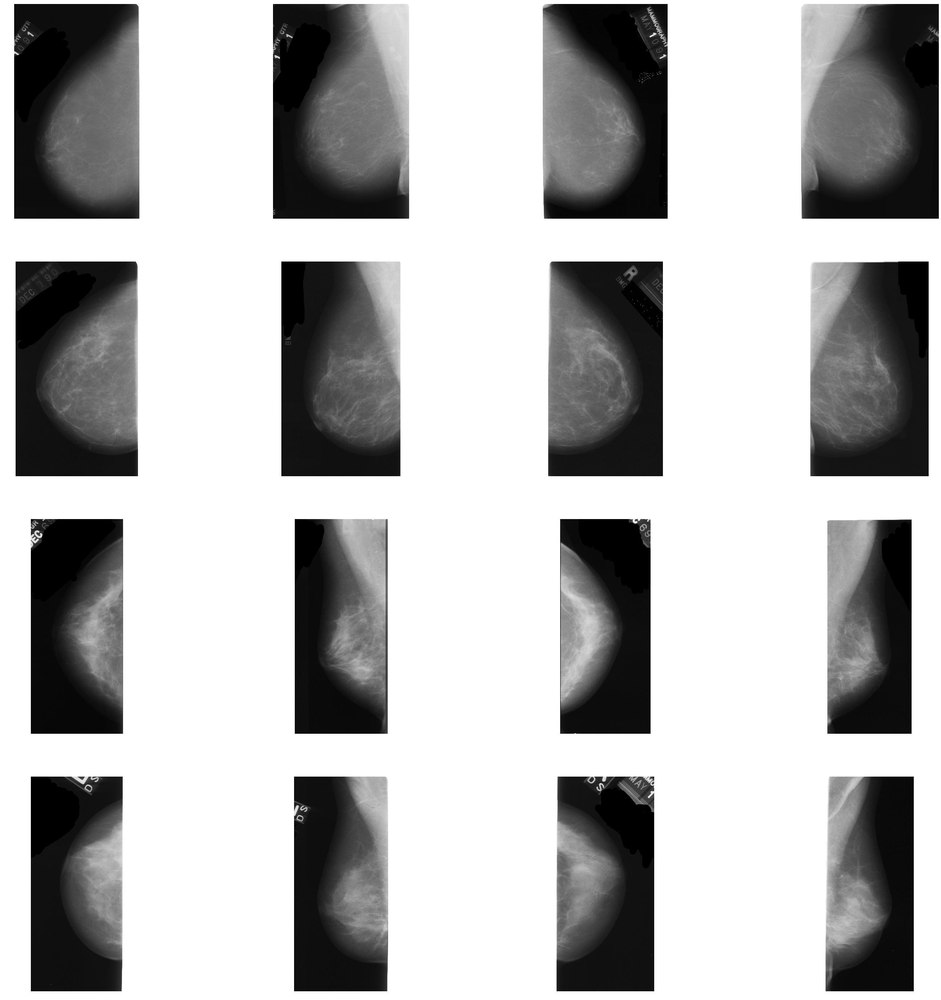

In [8]:
show_images(all_images,4,4)

### Zamiana na czarno-białe

In [9]:
all_grey_images = []
for img in all_images:
    all_grey_images.append(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))

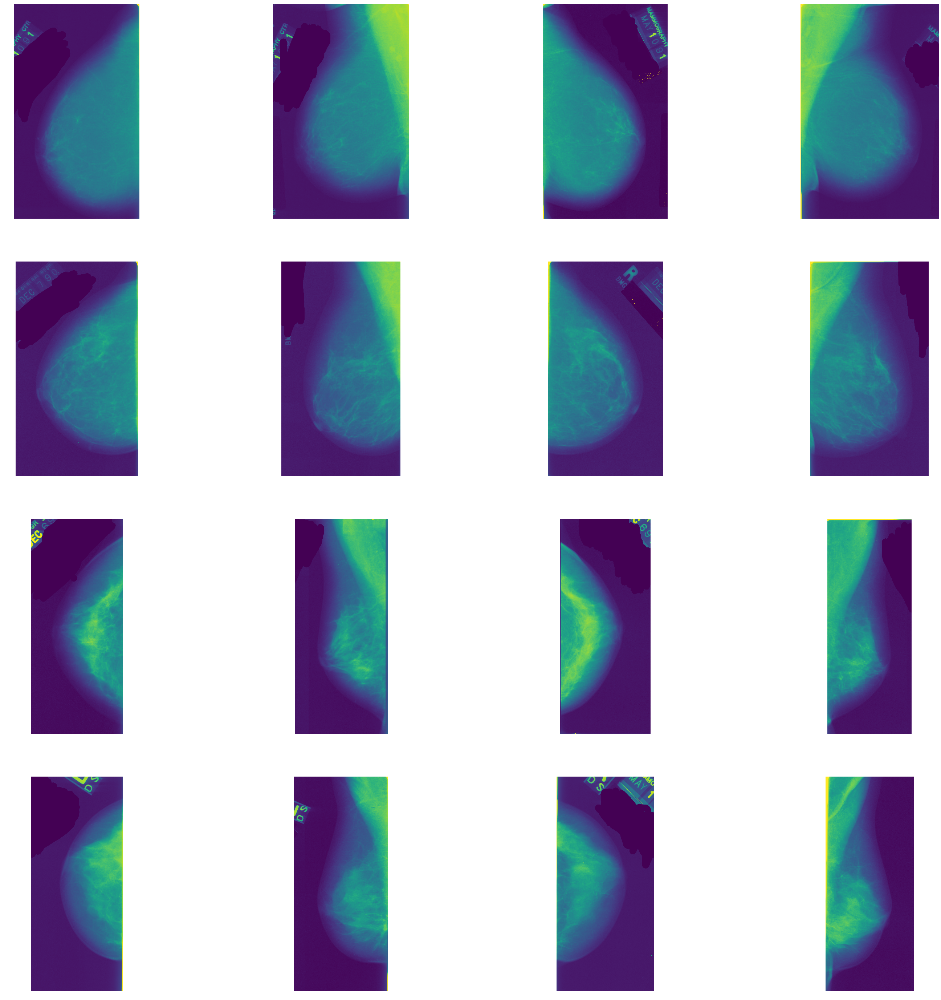

In [10]:
show_images(all_grey_images,4,4)

### Przygotowanie listy do przechowywania obrazów i informacji o nich

In [11]:
all_images_with_info = []

class ImageInfo():
    
    def __init__(self,img_id, raw_image):
        self.img_id = img_id
        self.raw_image = raw_image
        self.side = None
        self.projection = None
        self.first_ROI = None
        self.final_ROI = None

In [12]:
for i, img in zip(range(len(all_grey_images)), all_grey_images):
    all_images_with_info.append(ImageInfo(i,img))

## 1. Sprawdzanie rodzaju obrazu: L/P, MLO/CC

### 1.1. Sprawdzenie: obraz L czy P

In [13]:
# pętla po wszystkich obrazkach : 

L_P_sides = []

for img in all_grey_images:
    
    # sprawdzenie lewej strony
    if img[int(img.shape[0]/2), 20] < 40:
        L_P_sides.append("right")
        print("this is right")
    # sprawdzenie prawej strony
    elif img[int(img.shape[0]/2), img.shape[1]-20] < 40:
        L_P_sides.append("left")
        print("this is left")

this is right
this is right
this is left
this is left
this is right
this is right
this is left
this is left
this is right
this is right
this is left
this is left
this is right
this is right
this is left
this is left


In [14]:
for i, side in zip(range(len(all_images_with_info)), L_P_sides):
    all_images_with_info[i].side = side

In [15]:
all_images_with_info[0].side

'right'

### 1.2. Sprawdzenie: obraz CC czy MLO

In [16]:
# pętla po wszystkich: 

CC_or_MLO = []

for img in all_images_with_info:
    
    # check side
    if img.side == 'left':
        # number of very bright pixels
        n_b = len(img.raw_image[:, 50][np.where(img.raw_image[:, 50] > 150)])
        print("number of very bright pictures: " + str(n_b))
        print(img.raw_image.shape[0])
        if n_b > 0.5 * img.raw_image.shape[0]:
            CC_or_MLO.append("MLO")
            print("MLO")
            print("-----")
        else:
            CC_or_MLO.append("CC")
            print("CC")
            print("-----")
    else:
        # number of very bright pixels
        n_b = len(img.raw_image[:, -50][np.where(img.raw_image[:, -50] > 150)])
        print("number of very bright pictures: " + str(n_b))
        print(img.raw_image.shape[0])
        if n_b > 0.5 * img.raw_image.shape[0]:
            CC_or_MLO.append("MLO")
            print("MLO")
            print("-----")
        else:
            CC_or_MLO.append("CC")
            print("CC")
            print("-----")

number of very bright pictures: 93
5502
CC
-----
number of very bright pictures: 4149
5489
MLO
-----
number of very bright pictures: 3009
5488
MLO
-----
number of very bright pictures: 3983
5305
MLO
-----
number of very bright pictures: 2606
5369
CC
-----
number of very bright pictures: 3022
5484
MLO
-----
number of very bright pictures: 1885
5474
CC
-----
number of very bright pictures: 2671
5279
MLO
-----
number of very bright pictures: 129
4676
CC
-----
number of very bright pictures: 0
5518
CC
-----
number of very bright pictures: 2407
4844
CC
-----
number of very bright pictures: 3413
5471
MLO
-----
number of very bright pictures: 1813
4768
CC
-----
number of very bright pictures: 3820
5414
MLO
-----
number of very bright pictures: 597
4646
CC
-----
number of very bright pictures: 4208
5324
MLO
-----


In [17]:
for i, projection in zip(range(len(all_images_with_info)), CC_or_MLO):
    all_images_with_info[i].projection = projection

## 2. Wybranie największego konturu, obcięcie brzegów obrazu i usunięcie małych fragmentów

Zmiana obrazu na binarny służy w tym przypadku przede wszystkim temu, aby zobaczyć jak zastosowany próg potraktował rozmyte brzegi sutka i czy nie uciął części obszaru który jest interesujący. Na poniższych żółto-fioletowych obrazach widać, że zdecydowana większość pikseli obszaru zainteresowania jest rzeczywiście zaznaczona (nie ma bardzo poszarpanych brzegów i powycinanych plam).

In [18]:
threshold = 25

In [19]:
y=0
x=0
u=200    # ustalenie
d=200    # krawędzi
l=200    # do obcięcia
r=200

In [20]:
all_cropped_gray_images = []
all_rois = []

for img in all_grey_images:
    _, binary_img = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY_INV)
    inverted_img = 255 - binary_img
    cropped_img = inverted_img[u:inverted_img.shape[0]-d, l:inverted_img.shape[1]]
    
    # find contours
    cnts = cv2.findContours(cropped_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    
    # find biggest object on image
    mx = (0,0,0,0)      # biggest bounding box so far
    mx_area = 0
    for cont in cnts:
        x,y,w,h = cv2.boundingRect(cont)
        area = w*h
        if area > mx_area:
            mx = x,y,w,h
            mx_area = area
    x,y,w,h = mx

    # Output
    roi = img[y:y+h,x:x+w]
    binary_roi = cropped_img[y:y+h,x:x+w]
    
    all_cropped_gray_images.append(binary_roi)
    all_rois.append(roi)

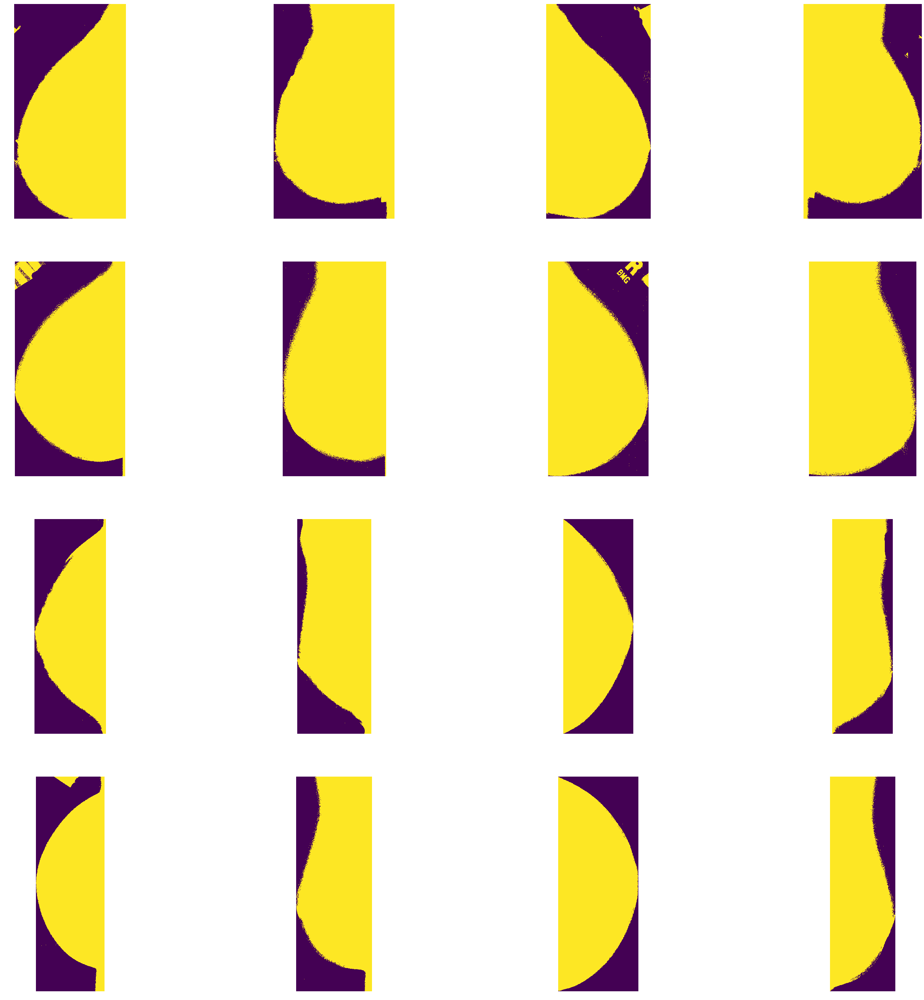

In [21]:
show_images(all_cropped_gray_images,4,4)

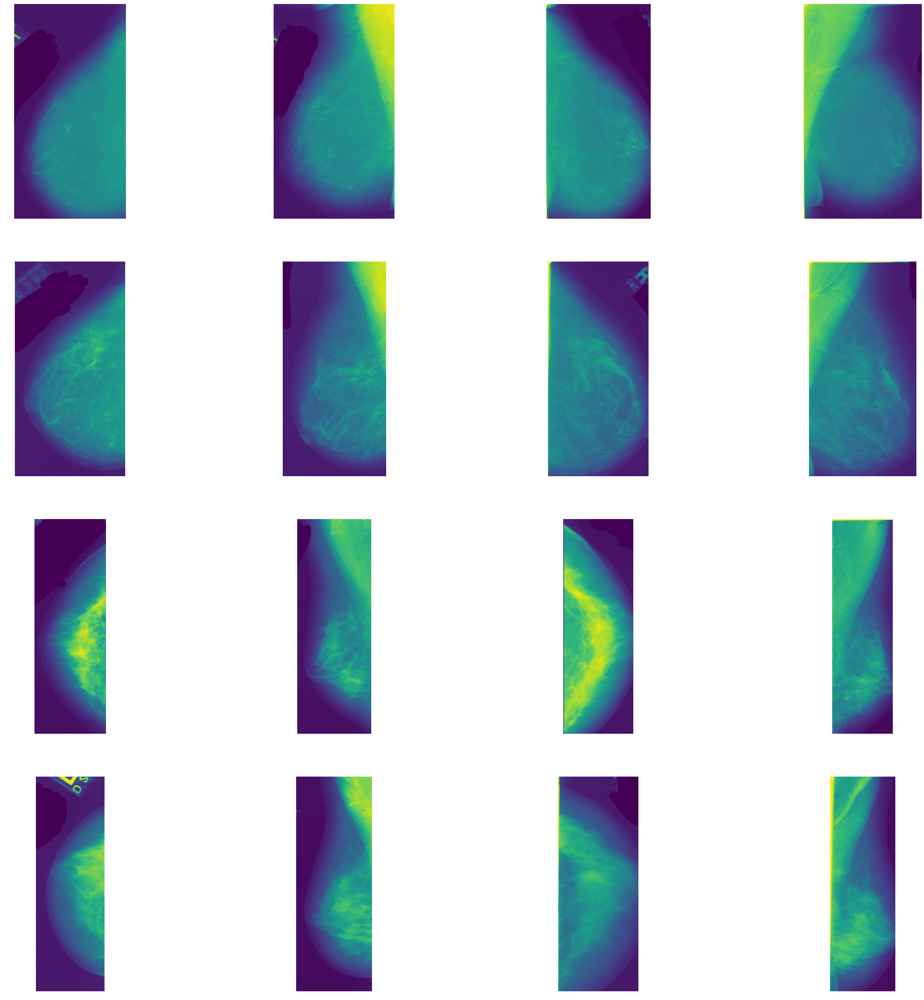

In [22]:
show_images(all_rois,4,4)

In [23]:
for i, roi in zip(range(len(all_images_with_info)), all_rois):
    all_images_with_info[i].first_ROI = roi

## 3. Wycinanie mięśnia z obrazów MLO

### Znalezienie największego konturu wewnątrz wcześniej wybranego ROI

1. Największym "jednolitym" obszarem w wybranym wcześniej obrazie jest obszar mięśnia
2. Na w ten sposób wyciętym fragmencie można wyznaczyć kontur na podstawie progu jasności
3. Na obszar mięśnia oddzielonego konturem można nałożyć maskę
4. Ten sam kontur można nałożyć na obraz pełnego ROI

In [24]:
img = all_rois[1].copy()

In [25]:
threshold = 40

In [26]:
_, binary_img = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY_INV)
inverted_img = 255 - binary_img
cropped_img = inverted_img[0:inverted_img.shape[0]-0, 0:inverted_img.shape[1]]

# find contours
cnts = cv2.findContours(cropped_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]

# find biggest object on image
mx = (0,0,0,0)      # biggest bounding box so far
mx_area = 0
for cont in cnts:
    x,y,w,h = cv2.boundingRect(cont)
    area = w*h
    if area > mx_area:
        mx = x,y,w,h
        mx_area = area
x,y,w,h = mx

# Output
roi = img[y:y+h,x:x+w]
binary_roi = cropped_img[y:y+h,x:x+w]

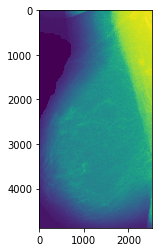

In [27]:
plt.imshow(roi)

In [28]:
kernel_dilation = np.ones((5,5), np.uint8)
dilation = cv2.dilate(roi, kernel_dilation, iterations=12)
ret, thresh = cv2.threshold(dilation, 150, 255, 0)

In [29]:
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

cnt = contours[0]
max_area = cv2.contourArea(cnt)

for cont in contours:
    if cv2.contourArea(cont) > max_area:
        cnt = cont
        max_area = cv2.contourArea(cont)

cv2.drawContours(roi, [cnt], 0, (255,0,255), 3)

array([[ 21,  22,  24, ..., 255, 255, 255],
       [ 22,  23,  24, ..., 255, 255, 255],
       [ 24,  24,  22, ..., 255, 255, 255],
       ...,
       [ 14,  13,  13, ...,  41,  41,  41],
       [ 14,  13,  13, ...,  40,  40,  39],
       [ 14,  13,  13, ...,  39,  39,  39]], dtype=uint8)

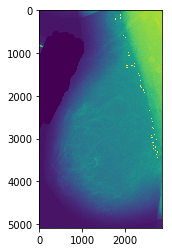

In [30]:
plt.imshow(img)

In [31]:
mask = np.zeros_like(roi) # Create mask where white is what we want, black otherwise
cv2.drawContours(mask, [cnt], 0, 255, -1) # Draw filled contour in mask
out = np.zeros_like(roi) # Extract out the object and place into output image
mask = 255 - mask
out[mask == 255] = roi[mask == 255]

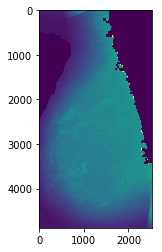

In [32]:
plt.imshow(out)

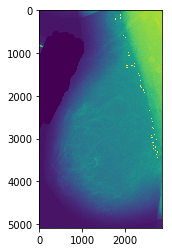

In [33]:
plt.imshow(img)

In [34]:
mask = np.zeros_like(roi) # Create mask where white is what we want, black otherwise
cv2.drawContours(mask, [cnt], 0, 255, -1) # Draw filled contour in mask
out = np.zeros_like(roi) # Extract out the object and place into output image
mask = 255 - mask
out[mask == 255] = roi[mask == 255]

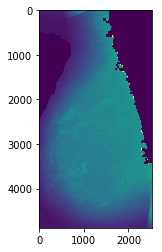

In [35]:
plt.imshow(out)

In [36]:
img.shape

(5089, 2865)

In [37]:
# jedna funkcja

def remove_muscle(img, side):
    
    threshold = 120
    _, binary_img = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY_INV)
    inverted_img = 255 - binary_img
    cropped_img = inverted_img[0:inverted_img.shape[0]-0, 0:inverted_img.shape[1]]

    # find contours
    cnts = cv2.findContours(cropped_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]

    # find biggest object on image
    mx = (0,0,0,0)      # biggest bounding box so far
    mx_area = 0
    for cont in cnts:
        x,y,w,h = cv2.boundingRect(cont)
        area = w*h
        if area > mx_area:
            mx = x,y,w,h
            mx_area = area
    x,y,w,h = mx

    # smaller roi - muscle
    roi = img[y:y+h,x:x+w]
    
    kernel_dilation = np.ones((5,5), np.uint8)
    dilation = cv2.dilate(roi, kernel_dilation, iterations=12)
    ret, thresh = cv2.threshold(dilation, 127, 255, 0)
    
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    cnt = contours[0]
    max_area = cv2.contourArea(cnt)

    for cont in contours:
        if cv2.contourArea(cont) > max_area:
            cnt = cont
            max_area = cv2.contourArea(cont)

    cv2.drawContours(roi, [cnt], 0, (255,0,255), 3)
    
    if side == 'left':
    
        mask = np.zeros_like(img) # Create mask where white is what we want, black otherwise
        cv2.drawContours(mask, [cnt], 0, 255, -1) # Draw filled contour in mask
        out = np.zeros_like(img) # Extract out the object and place into output image
        mask = 255 - mask
        out[mask == 255] = img[mask == 255]
        
        return out

    else:

        mask = np.zeros_like(roi) # Create mask where white is what we want, black otherwise
        cv2.drawContours(mask, [cnt], 0, 255, -1) # Draw filled contour in mask
        out = np.zeros_like(roi) # Extract out the object and place into output image
        mask = 255 - mask
        out[mask == 255] = roi[mask == 255]

        img[0:out.shape[0], img.shape[1]-out.shape[1]:img.shape[1]] = out
    
        return img

In [38]:
mask.shape

(4880, 2528)

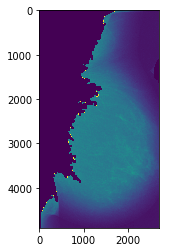

In [39]:
MLO_1 = all_rois[3].copy()
final = remove_muscle(MLO_1, 'left')
plt.imshow(final)

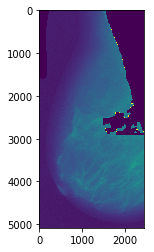

In [40]:
MLO_1 = all_rois[5].copy()
final = remove_muscle(MLO_1, 'right')
plt.imshow(final)

### 4. Nałożenie maski na tło dookoła

1. Znalezienie konturu na podstawie progu
2. Nałożenie maski na tło oddzielone konturem

In [41]:
new_out = out.copy()

In [42]:
def contour_background(raw_img):
    img = raw_img.copy()
    kernel_dilation = np.ones((5,5), np.uint8)
    dilation = cv2.dilate(img, kernel_dilation, iterations=12)
    ret, thresh = cv2.threshold(dilation, 30, 255, 0)

    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    cnt = contours[0]
    max_area = cv2.contourArea(cnt)

    for cont in contours:
        if cv2.contourArea(cont) > max_area:
            cnt = cont
            max_area = cv2.contourArea(cont)

    # cv2.drawContours(img, [cnt], 0, (255,0,255), 3)
    
    mask = np.zeros_like(img) # Create mask where white is what we want, black otherwise
    cv2.drawContours(mask, [cnt], 0, 255, -1) # Draw filled contour in mask
    final_out = np.zeros_like(img) # Extract out the object and place into output image
    # mask = 255 - mask
    final_out[mask == 255] = img[mask == 255]
    return final_out

In [43]:
f = contour_background(new_out)

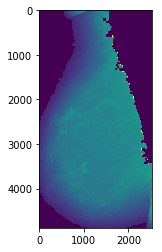

In [44]:
plt.imshow(f)

## Zastosowanie metody do wszystkich obrazów

In [45]:
for image in all_images_with_info:
    
    if image.projection == "CC":
        
        # wystarczy dodać maskę na tło wokół konturu
        image.final_ROI = contour_background(image.first_ROI)
    
    if image.projection == "MLO":
        
        if image.side == 'left':
            # najpierw usunięcie mięśnia
            no_muscle_mlo = remove_muscle(image.first_ROI, 'left')
        else:
            no_muscle_mlo = remove_muscle(image.first_ROI, 'right')
        
        # później dodanie maski wokół konturu
        image.final_ROI = contour_background(no_muscle_mlo)

In [46]:
all_final_images = []

for elem in all_images_with_info:
    all_final_images.append(elem.final_ROI)
    cv2.imwrite(r'sample_images\results\final_'+str(elem.img_id)+".png", elem.final_ROI)

In [47]:
# cechy tekstury
# metoda gradientowa
# metoda hougha

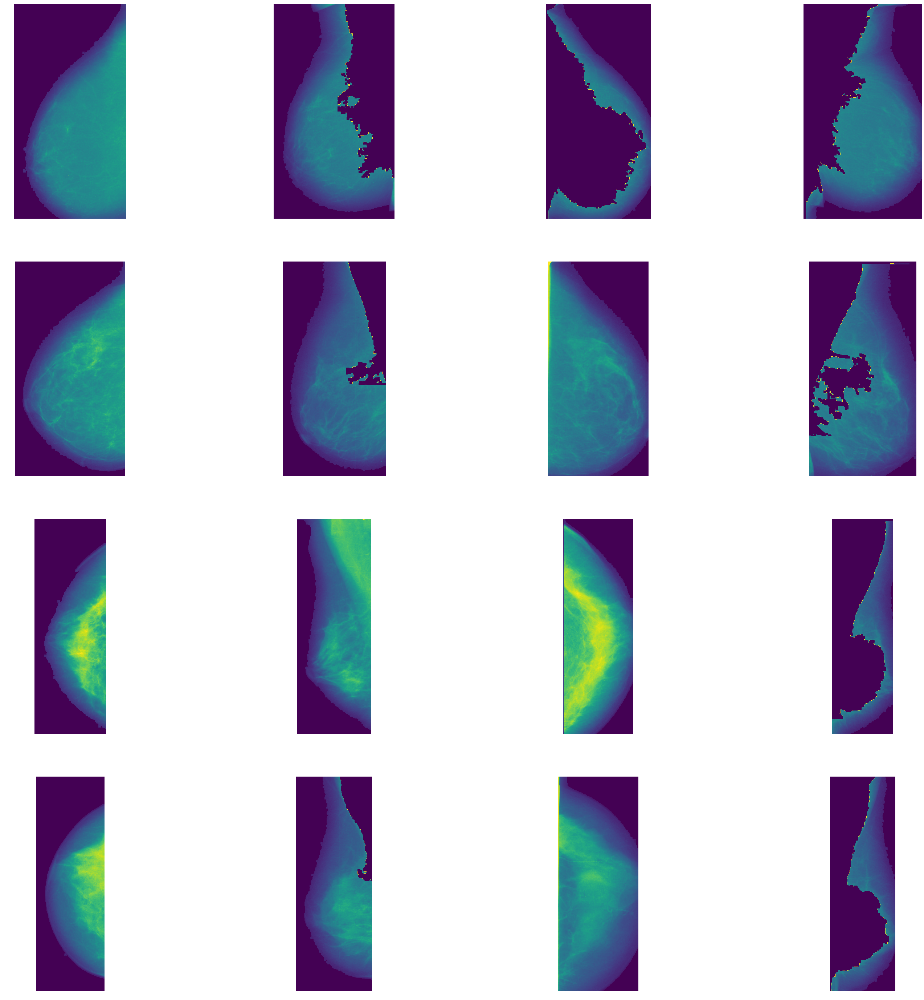

In [48]:
show_images(all_final_images, 4, 4)

## Rysowanie histogramów

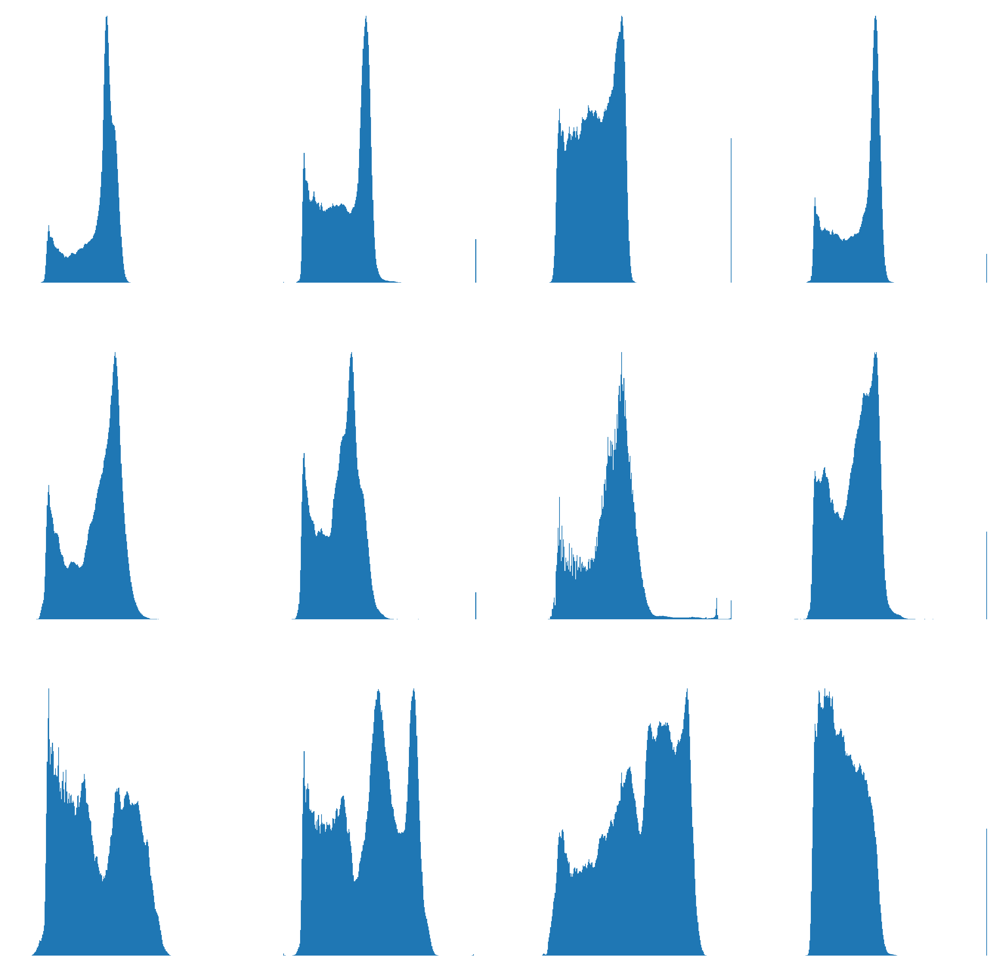

In [49]:
# z wycięciem 0 = tła

fig,axes = plt.subplots(nrows = 3, ncols = 4, figsize=(50,50))

for ax in axes.flatten():
    ax.axis('off')

for j in range(3):    
    for i in range(4):
        hist = cv2.calcHist([all_final_images[j*4 + i]],[0],None,[256],[1,256])
        axes[j,i].hist(all_final_images[j*4 + i].ravel(),256,[1,256])

plt.show()

## Zliczanie pikseli o konkretnej jasności

highest value: 104
last non zero value: 219


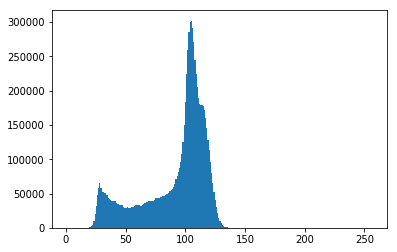

In [50]:
y, x, _ = plt.hist(all_final_images[0].ravel(),256,[1,256])

print("highest value: " + str(np.argmax(y)))
print("last non zero value: " + str(np.max(np.nonzero(y))))

highest value: 104
last non zero value: 219
highest value: 109
last non zero value: 254
highest value: 109
last non zero value: 254
highest value: 107
last non zero value: 254
highest value: 115
last non zero value: 214
highest value: 90
last non zero value: 254
highest value: 109
last non zero value: 254
highest value: 108
last non zero value: 254
highest value: 27
last non zero value: 189
highest value: 172
last non zero value: 253
highest value: 196
last non zero value: 223
highest value: 40
last non zero value: 254
highest value: 68
last non zero value: 210
highest value: 29
last non zero value: 254
highest value: 104
last non zero value: 254
highest value: 29
last non zero value: 254


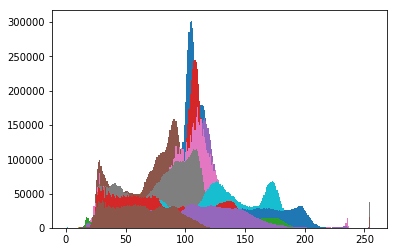

In [51]:
for img in all_final_images:
    y, x, _ = plt.hist(img.ravel(),256,[1,256])

    print("highest value: " + str(np.argmax(y)))
    print("last non zero value: " + str(np.max(np.nonzero(y))))

In [52]:
sample_image = all_final_images[12]

In [53]:
# ustalony threshold:

thr_start = 125
thr_stop = 256

In [54]:
_, binary_img = cv2.threshold(sample_image, thr_start, thr_stop, cv2.THRESH_BINARY_INV)

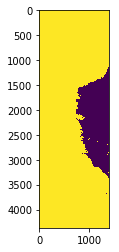

In [55]:
plt.imshow(binary_img)

In [56]:
height, width = binary_img.shape
roi_size = height*width - cv2.countNonZero(binary_img)
print(roi_size)

954847


In [57]:
original_roi_size = roi_size

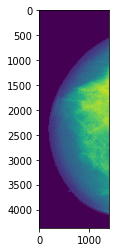

In [58]:
plt.imshow(sample_image)

In [59]:
# dla wszystkich obrazów: 

for img in all_final_images:
    _, binary_img = cv2.threshold(img, thr_start, thr_stop, cv2.THRESH_BINARY_INV)
    height, width = binary_img.shape
    roi_size = height*width - cv2.countNonZero(binary_img)
    print(roi_size)

93972
83211
29301
33608
693363
54148
920388
91265
836592
2827222
2039804
16894
954847
882817
1116031
15272


## Przekształcenie do transformaty falkowej

### PyWavelets 

In [60]:
import dtcwt
import pywt
import pywt.data

In [61]:
original = all_final_images[12]

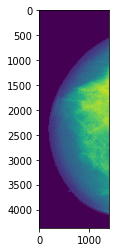

In [62]:
plt.imshow(original)

In [63]:
# wavelet transform
transform = dtcwt.Transform2d()

# Compute two levels of dtcwt with the defaul wavelet family
mandrill_t = transform.forward(original, nlevels=2)

In [64]:
from scipy.misc import imread

from matplotlib.pyplot import *
import numpy as np

import dtcwt

In [65]:
type(original)

numpy.ndarray

In [66]:
# czarne tło i linie - sprawdzić jak wygląda
# 20-30 % najsilniejszych współczynników (i wziąć wartości bezwzględne)
# narysować transformatę odwrotną z usuniętymi współczynnikami

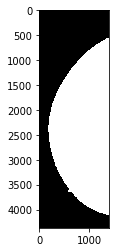

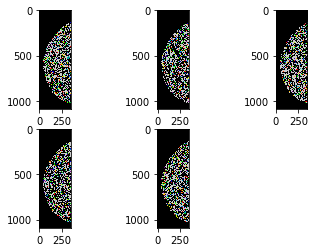

In [67]:
import dtcwt


# Show mandrill
figure(1)
imshow(original, cmap=cm.gray, clim=(0,1))

transform = dtcwt.Transform2d()

# Compute two levels of dtcwt with the defaul wavelet family
mandrill_t = transform.forward(original, nlevels=2)

# dodac 2, 3, 4 poziomy - przetestować
# 1. dla każdego obrazka 0.7*max(wartosc abs konkretnego małego obrazka) 
#     - zweryfikować różne rodzaje falek i liczbę poziomów (nie niżej niz 56x56 pikseli w obrazku w poziomie)
# 2. wspólny 0.7*max(dla każdego poziomu wybieramy najwiekszą wartość na cały poziom [z 6 obrazków]); dla 2 poziomów 2
# wartości max, dla 3 - 3 wartości max itp
# 3. jeden wspólny max dla wszystkich obrazków ze wszystkich poziomów i kierunków

# i powrót do transformaty odwrotnej i analogiczne jak w oryginale obliczenie obszaru

# Show the absolute images for each direction in level 2.
# Note that the 2nd level has index 1 since the 1st has index 0.
figure(2)
for slice_idx in range(1, mandrill_t.highpasses[1].shape[2]):
    subplot(2, 3, slice_idx)
    imshow(np.angle(mandrill_t.highpasses[1][:,:,slice_idx]), cmap=cm.nipy_spectral, clim=(0, 1))


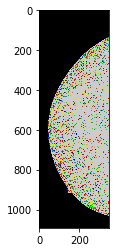

In [103]:
imshow(np.abs(mandrill_t.highpasses[1][:,:,0]), cmap=cm.nipy_spectral, clim=(0, 1))

In [140]:
mandrill_t.highpasses[1][:,:,5]

array([[0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       ...,
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j]])

In [128]:
type(mandrill_t)

dtcwt.numpy.common.Pyramid

In [109]:
np.max(np.abs(mandrill_t.highpasses[1][:,:,slice_idx]))

58.38790965460122

In [110]:
thr_value = 0.7*np.max(np.abs(mandrill_t.highpasses[1][:,:,slice_idx]))
print(thr_value)

40.871536758220856


In [111]:
original_roi_size

15272

In [112]:
abs_pixel_values = np.abs(mandrill_t.highpasses[1][:,:,slice_idx])

In [113]:
abs_pixel_values

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [71]:
# usunąć piksele które są niższe niż 0.7*max

In [114]:
super_threshold_indices = abs_pixel_values < thr_value
mandrill_t.highpasses[1][:,:,slice_idx][super_threshold_indices] = 0

In [94]:
abs_pixel_values

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
# policzyc liczbe niezerowych elementow w macierzy abs / phase

In [120]:
np.size(abs_pixel_values) - len(super_threshold_indices)

378924

In [115]:
# mandrill_t.highpasses[1][:,:,slice_idx] = abs_pixel_values

In [ ]:
# wrocic do oryginalnego obrazka

In [116]:
new_transformed_picture = transform.inverse(mandrill_t)

In [ ]:
# policzyc ile jest pikseli które zostają powyżej progu - w oryginale i w przetworzonym

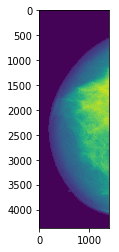

In [118]:
imshow(new_transformed_picture)

In [ ]:
from pylab import *

In [ ]:
# Show the absolute images for each direction in level 2.
# Note that the 2nd level has index 1 since the 1st has index 0.

for slice_idx in range(mandrill_t.highpasses[1].shape[2]):
    plt.subplots(3,4)
    ax.imshow(np.abs(mandrill_t.highpasses[1][:,:,slice_idx]), cmap=cm.spectral, clim=(0, 1))

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import pywt
import pywt.data


# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail 1','Vertical detail 1', 'Diagonal detail 1',
          'Approximation','Horizontal detail 2', 'Vertical detail 2', 'Diagonal detail 2',
          'Approximation', 'Horizontal detail 3', 'Vertical detail 3', 'Diagonal detail 3']
coeffs2 = pywt.wavedec2(original, 'db1', level=3)

LL, (LH_1, HL_1, HH_1), (LH_2, HL_2, HH_2), (LH_3, HL_3, HH_3) = coeffs2

fig, ax = plt.subplots(3,4)
fig.set_figheight(15)
fig.set_figwidth(15)

for i, a in enumerate([LL, LH_1, HL_1, HH_1, LL, LH_2, HL_2, HH_2, LL, LH_3, HL_3, HH_3]):
  
    if i < 4:
        ax[0,i].imshow(a, interpolation="nearest", cmap=plt.cm.gray)
        ax[0,i].set_title(titles[i], fontsize=10)
        ax[0,i].set_xticks([])
        ax[0,i].set_yticks([])
        
    if 4 <= i < 8:
        ax[1,i-4].imshow(a, interpolation="nearest", cmap=plt.cm.gray)
        ax[1,i-4].set_title(titles[i], fontsize=10)
        ax[1,i-4].set_xticks([])
        ax[1,i-4].set_yticks([])
        
    if 8 <= i < 12:
        ax[2,i-8].imshow(a, interpolation="nearest", cmap=plt.cm.gray)
        ax[2,i-8].set_title(titles[i], fontsize=10)
        ax[2,i-8].set_xticks([])
        ax[2,i-8].set_yticks([])
    


fig.tight_layout()
plt.show()

In [ ]:
transformed_imgs = pywt.wavedec2(original, 'db1', level=3)

In [ ]:
len(transformed_imgs)

In [ ]:
len(transformed_imgs[0])

In [ ]:
print(len(transformed_imgs[1]))
print(len(transformed_imgs[2]))
print(len(transformed_imgs[3]))

In [ ]:
transformed_imgs[1]

In [ ]:
for i in range(1, 4):
    print("Level: " + str(i))
    lvl_sum = np.sum(transformed_imgs[i][0])+np.sum(transformed_imgs[i][0])+np.sum(transformed_imgs[i][0])
    print(lvl_sum)

In [ ]:
# piątek 16.30

# tabelka - ten sam obrazek w różnych wersjach
# różne obrazki
# complex wavelets multilevel
# suma z jednego poziomu
# liczyc gęstość - próg ten sam jak wcześniej
# wyrzucać ciemne i to samo